## Evaluate the denoising performance of all methods and models available to us


In [1]:
from Scripts.essentials import *
from scipy.signal import savgol_filter

Available computational components
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 10799068196379094219
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 2057830400
locality {
  bus_id: 1
  links {
  }
}
incarnation: 1876650428628243075
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3050 OEM, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


# Load the models

In [3]:
ensemble_model = make_ensemble()
ensemble_model.load_weights(filepath= "Models/ensembleModelRes.h5")

standard_model = make_standard()
standard_model.load_weights(filepath = "Models/standardModel.h5")

# Cascaded model
cascade = tf.keras.models.load_model("Models/unet_three.23-64.96.h5")

import BartonModel
barton_model = BartonModel.load_model()
barton_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_unnormalized (InputLa  [(None, 600, 1, 1)]      0         
 yer)                                                            
                                                                 
 input_ (Normalization)      (None, 600, 1, 1)         1201      
                                                                 
 conv_1_ (Conv2D)            (None, 600, 1, 256)       2560      
                                                                 
 bnorm_1_ (BatchNormalizatio  (None, 600, 1, 256)      1024      
 n)                                                              
                                                                 
 re_lu (ReLU)                (None, 600, 1, 256)       0         
                                                                 
 conv_2_ (Conv2D)            (None, 600, 1, 128)       1639

In [4]:
# Define the Signal-to-Noise(SNR) ratio
def SNR(signal, noise, predicted_noise, eps = 0.0001):

    # SSNR from Han et al.
    s = np.mean(signal)
    n = np.std((noise - predicted_noise)) + eps # add eps if noise is 0
    return np.round((s)/(n), 1)

313/313 [==============================] - 2s 5ms/step


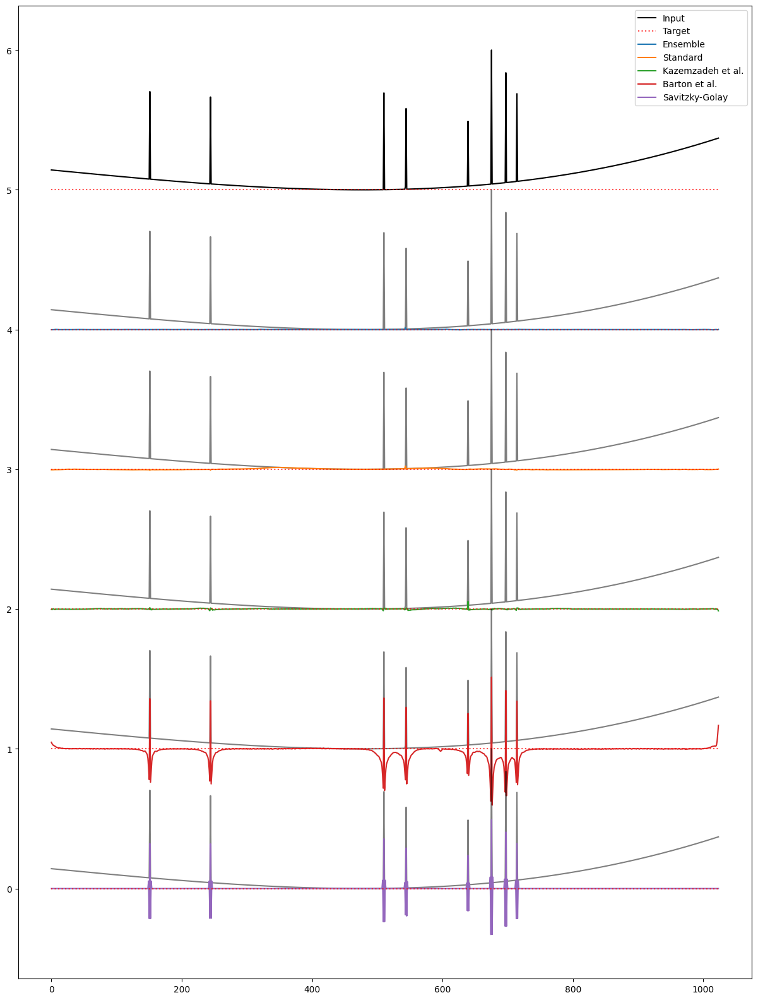

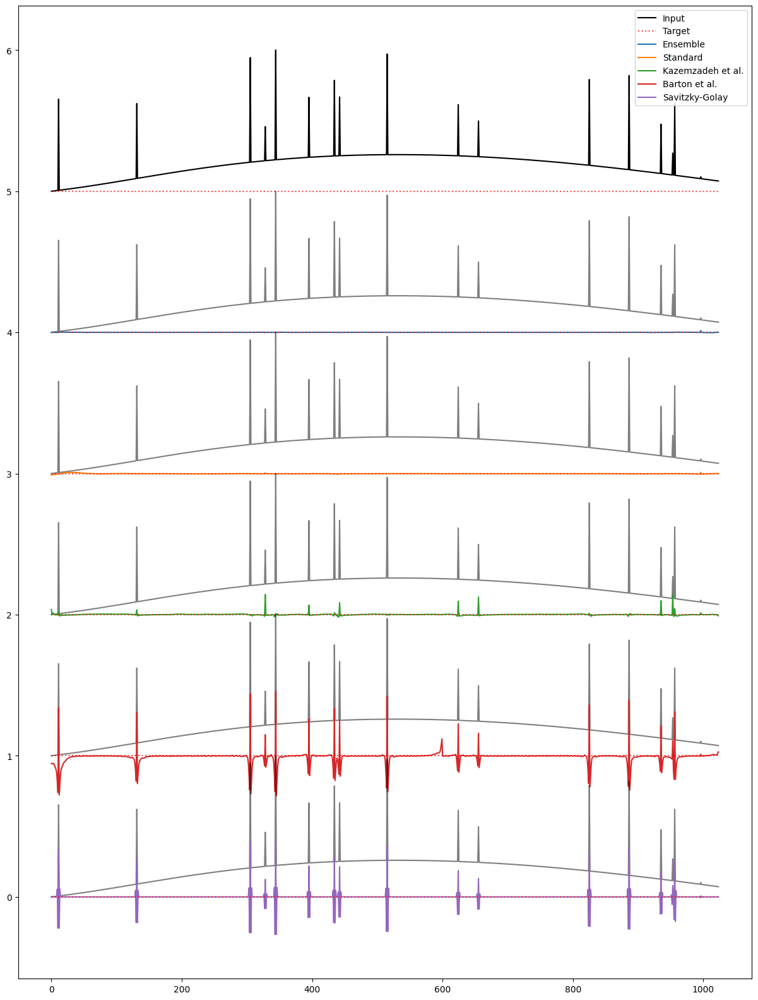

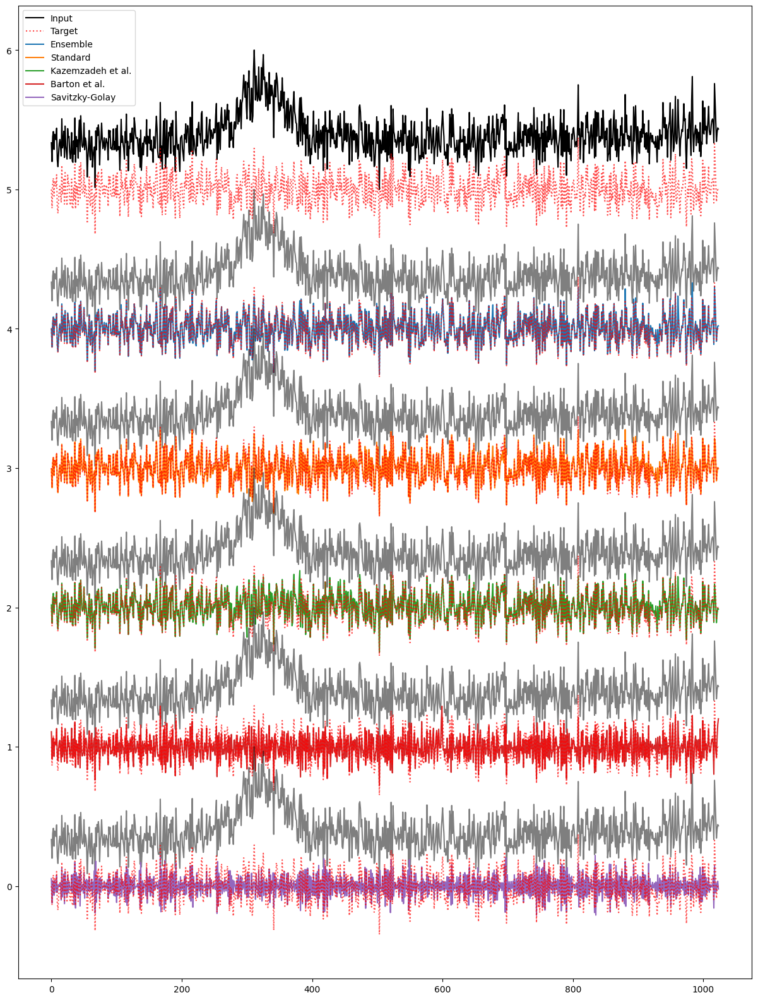

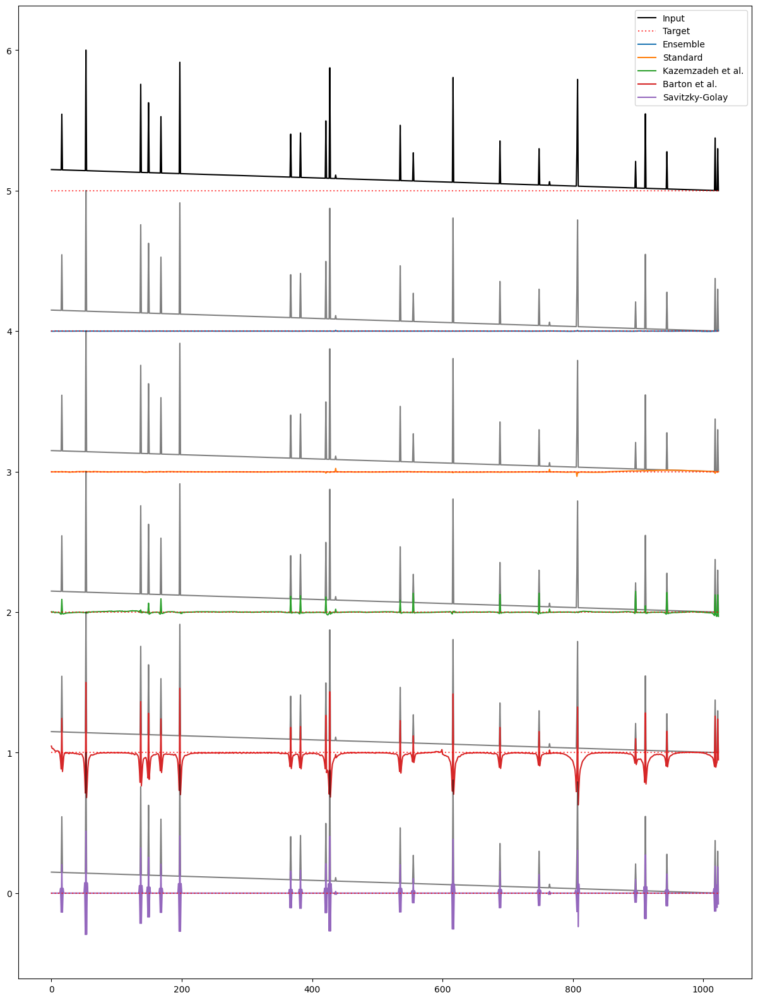

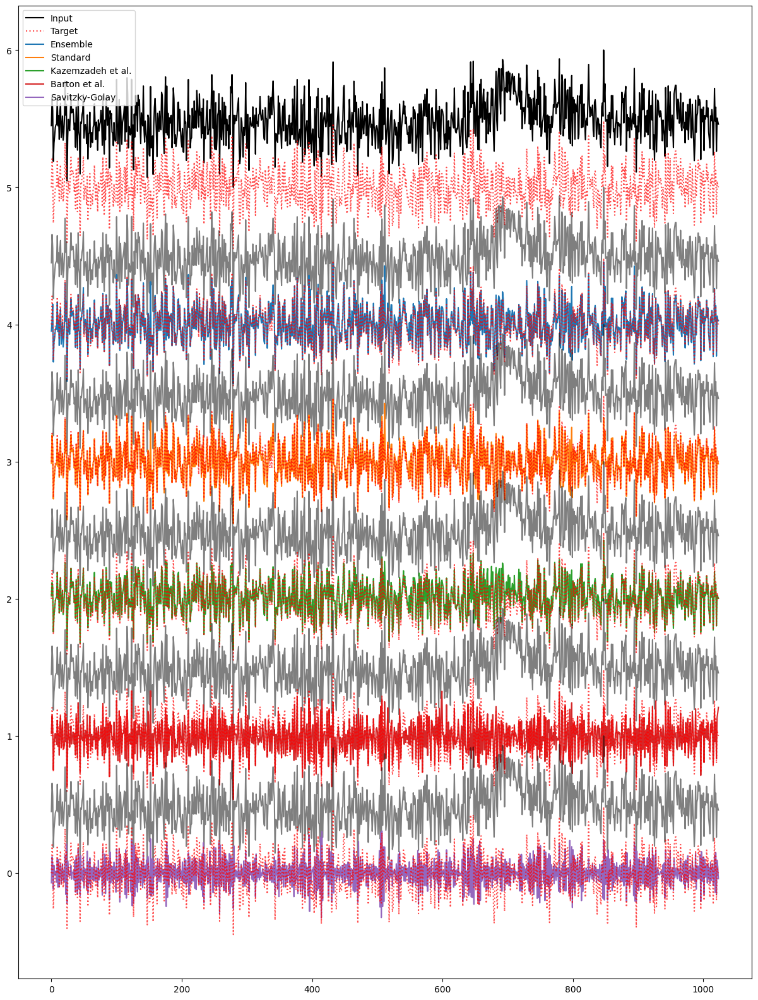

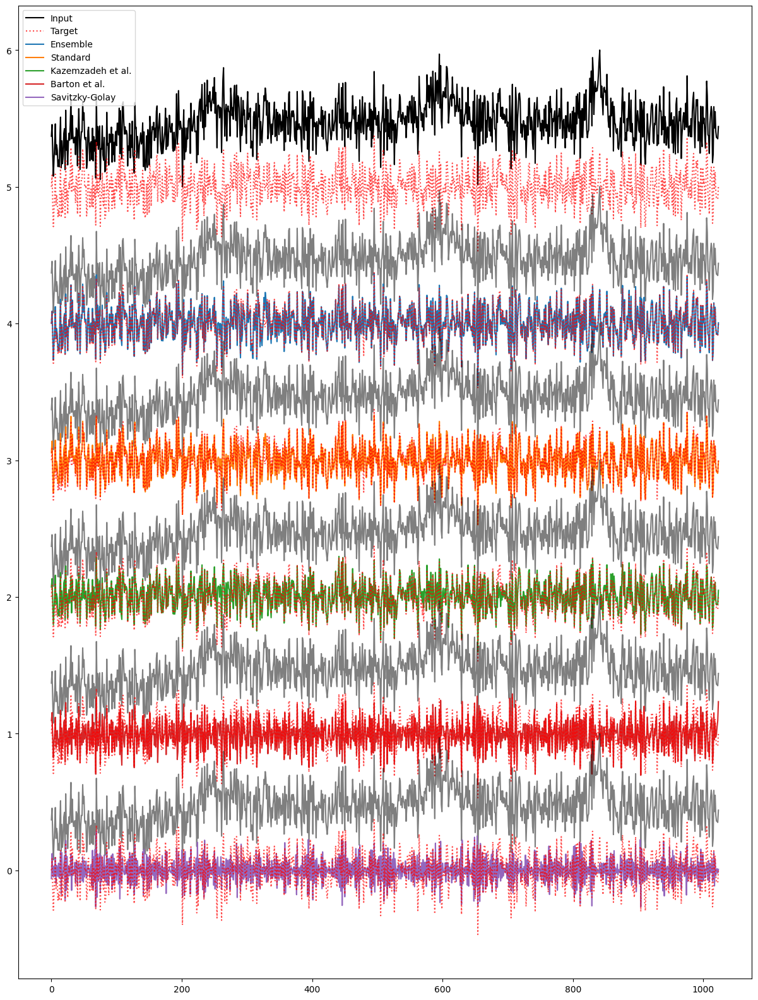

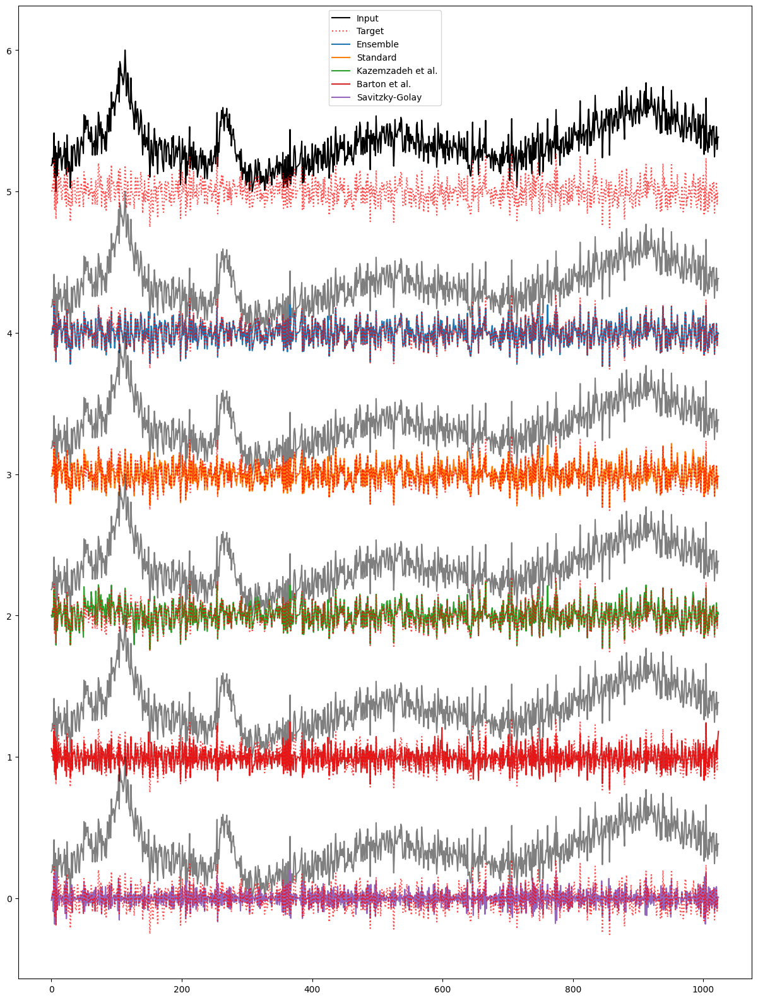

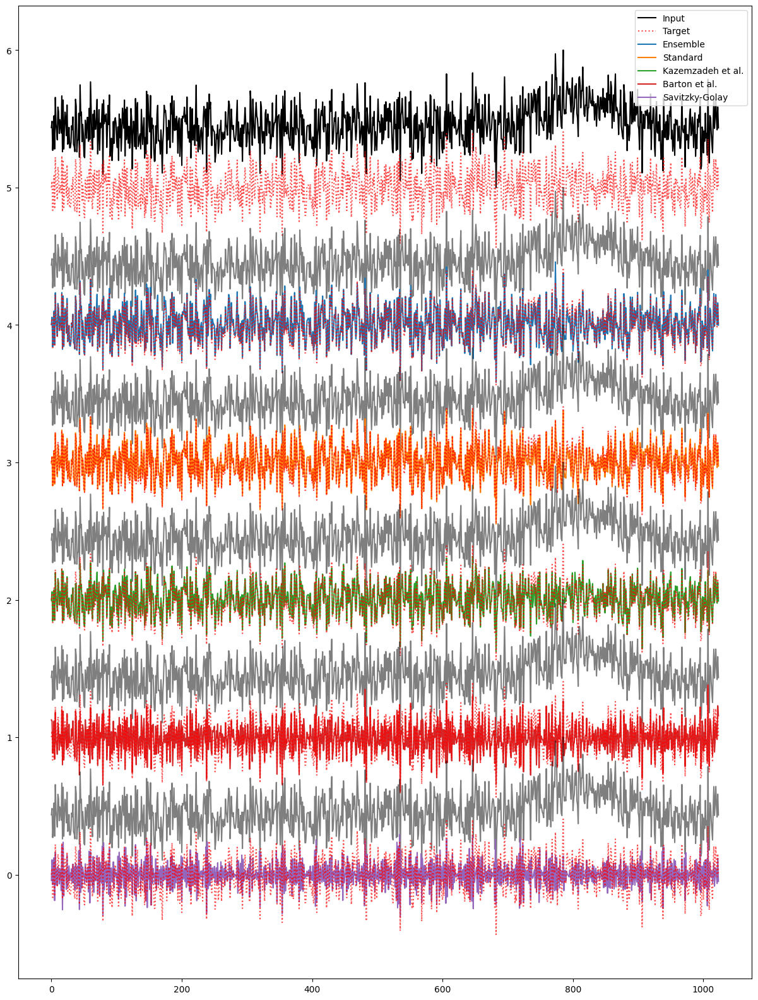

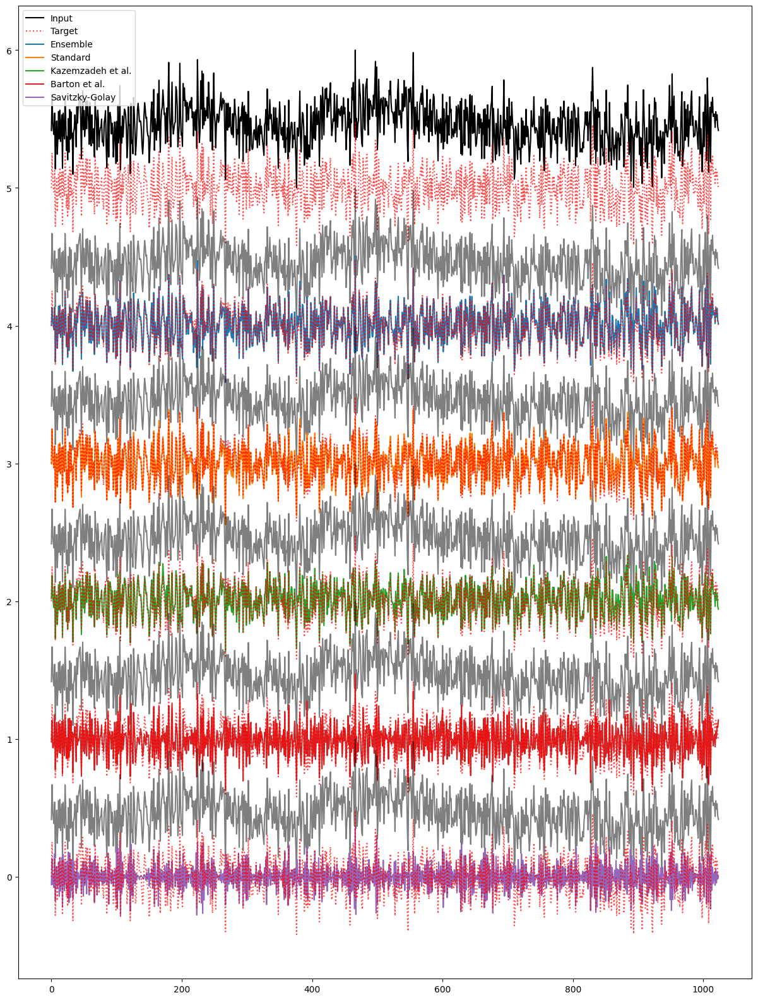

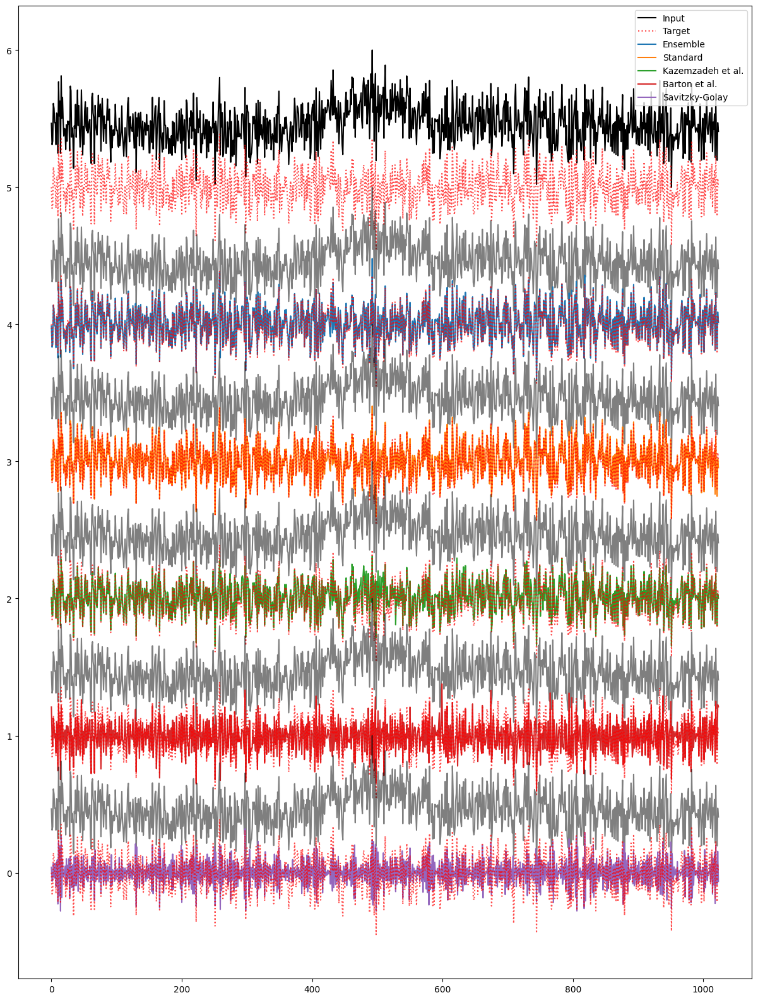

Ensemble
	RMSE: 
		Mean: 0.02 
		Median: 0.02 
		Variance: 0.0
	Max error: 
		Mean: 0.15 
		Median: 0.13 
		Variance: 0.01
	SNR: 
		Mean: 4.94 
		Median: 2.1 
		Variance: 102.92
Standard
	RMSE: 
		Mean: 0.02 
		Median: 0.02 
		Variance: 0.0
	Max error: 
		Mean: 0.15 
		Median: 0.14 
		Variance: 0.01
	SNR: 
		Mean: 3.45 
		Median: 2.0 
		Variance: 19.73
Kazemzadeh et al.
	RMSE: 
		Mean: 0.03 
		Median: 0.03 
		Variance: 0.0
	Max error: 
		Mean: 0.23 
		Median: 0.23 
		Variance: 0.01
	SNR: 
		Mean: 1.39 
		Median: 1.2 
		Variance: 0.89
Barton et al.
	RMSE: 
		Mean: 0.05 
		Median: 0.05 
		Variance: 0.0
	Max error: 
		Mean: 0.31 
		Median: 0.29 
		Variance: 0.01
	SNR: 
		Mean: 1.18 
		Median: 0.7 
		Variance: 3.29
Savitzky-Golay
	RMSE: 
		Mean: 0.06 
		Median: 0.06 
		Variance: 0.0
	Max error: 
		Mean: 0.28 
		Median: 0.28 
		Variance: 0.01
	SNR: 
		Mean: 1.22 
		Median: 0.6 
		Variance: 46.64
Raw data
	SNR: 
		Mean: 1.57 
		Median: 0.4 
		Variance: 88.18


In [5]:
d_path = "data/Generated_data/"
datasets = [
            (d_path+"X_1024_10_300.npy", d_path+"y_noise_1024_10_300.npy", d_path+"y_peaks_1024_10_300.npy"),
           ]

metrics_dict = {}
full_metrics_dict = {}
for data in datasets:

    # Load the dataset we want to evaluate
    X = np.load(data[0])[:]
    target = np.load(data[1])[:]
    signal = np.load(data[2])[:]
    
    # DL-predictions
    # Ensemble model predictions
    ensemble_preds = ensemble_model.predict(X, verbose = 0)
    # Get N
    ensemble_preds = ensemble_preds[2]
    
    # Standard model
    standard_preds = standard_model.predict(X, verbose = 0)
    # Get N
    standard_preds = standard_preds[2]
    
    # Cascaded preds, multiply X by 1000 to set the required input shape
    cascaded_preds = cascade.predict(X * 1000, verbose = 0)
        # Divide by 1000 to return to the normalized scope
    cascaded_p = np.squeeze(cascaded_preds[1]/1000)
    cascaded_bl = np.squeeze(X - cascaded_preds[0]/1000)
        # Subtract the spectrum from the input spectrum to get the estimated noise prediction
    cascaded_preds = np.squeeze(X) - cascaded_p - cascaded_bl  # The noise found is the noisy P minus predicted P

    # Barton et al.
    barton_data = np.squeeze(X).reshape(len(X), len(X[0]), 1, 1) * 4000
    #barton_data = barton_data[:, :600, :1, :1] # Their model is defined for spectra with 600 frequencies
    pred_1 = barton_model.predict(barton_data[:, :600, :1, :1]) # Get the predictions
    pred_2 = barton_model.predict(barton_data[:, 1024 - 600:, :1, :1])
    barton_clean = np.hstack((pred_1, pred_2[:, 600 * 2 - 1024:]))
    #barton_clean = barton_model.predict(barton_data) # Get the predictions
    barton_preds = (np.squeeze(barton_data) - np.squeeze(barton_clean)) / 4000 # get the noise prediction by subtracting the clean spectrum from the noisy
    
    # Savgol filter
    savgol_clean = savgol_filter(X, 5, 2, axis = 1) # Denoise with savgol
    savgol_preds = (X - savgol_clean) # Get the noise that was removed
        

    method_preds = [ensemble_preds, standard_preds, cascaded_preds, barton_preds, savgol_preds]
    method_names = ["Ensemble", "Standard", "Kazemzadeh et al.", "Barton et al.", "Savitzky-Golay"]

    # Save the figures in a unique folder for potential use later
    path = "Figures/"+ data[1].split("/")[-1]
    if not os.path.exists(path):
        os.mkdir(path)
    
    for spec_ix in range(10): 
        plt.figure(figsize=(15, 20))
        plt.plot(X[spec_ix]+len(method_preds), label = "Input", color = "Black")
        plt.plot(target[spec_ix]+len(method_preds), label = "Target", color = "Red", ls =":", alpha = 0.7)
        for i in range(len(method_preds)):
            indent = len(method_preds) - i -1
    
            plt.plot(X[spec_ix] + indent, color = "Black", alpha = 0.5)
            plt.plot(method_preds[i][spec_ix] + indent, label = method_names[i])
            plt.plot(target[spec_ix] + indent, color = "Red", ls =":", alpha = 0.7)
            
    
        plt.legend()
        plt.savefig(path + "/Noise" + str(spec_ix) + ".png")
        plt.show()
    
    # Gather the metrics
    metrics_dict[data[0]] = {}
    full_metrics_dict[data[0]] = {}
    for preds, name in zip(method_preds, method_names):
        
        print(name)
        
        #RMSE_metrics = root_mean_squared_error(target, np.squeeze(preds))
        RMSE_metrics = []
        MaxError_metrics = []
        SNR_metrics = []

        for noise, pred, sig in zip(target, np.squeeze(preds), signal):
            RMSE_metrics.append(root_mean_squared_error(pred, noise)) # I defined the metrics with true, pred order...
            MaxError_metrics.append(metrics.max_error(noise, pred))
            if np.sum(sig) == 0. or np.std(noise - pred) == 0:
               continue # Skip the edge cases for this metric, signal or noise == 0 will make it crash
            SNR_metrics.append(SNR(sig, noise, pred))
                
        
        # Print statistics
        print("\tRMSE:",
              "\n\t\tMean:", np.round(np.mean(RMSE_metrics), 2),
              "\n\t\tMedian:", np.round(np.median(RMSE_metrics), 2),
              "\n\t\tVariance:", np.round(np.var(RMSE_metrics), 2))
        
        print("\tMax error:",
              "\n\t\tMean:", np.round(np.mean(MaxError_metrics), 2),
              "\n\t\tMedian:", np.round(np.median(MaxError_metrics), 2),
              "\n\t\tVariance:", np.round(np.var(MaxError_metrics), 2))
        
        print("\tSNR:",
              "\n\t\tMean:", np.round(np.mean(SNR_metrics), 2),
              "\n\t\tMedian:", np.round(np.median(SNR_metrics), 2),
              "\n\t\tVariance:", np.round(np.var(SNR_metrics), 2))
    

        metrics_dict[data[0]][name] = [np.mean(RMSE_metrics), np.median(RMSE_metrics), np.var(RMSE_metrics),
                                       np.mean(MaxError_metrics), np.median(MaxError_metrics),
                                       np.var(MaxError_metrics),
                                      np.mean(SNR_metrics), np.median(SNR_metrics), np.var(SNR_metrics)]
        full_metrics_dict[data[0]][name] = [np.array(RMSE_metrics), np.array(MaxError_metrics), np.array(SNR_metrics)]



    # Get the snr metrics from the raw data
    SNR_metrics = []
    for sig, noise in zip(signal, target):
        SNR_metrics.append(SNR(sig, noise, 0))
    print("Raw data")
    print("\tSNR:",
              "\n\t\tMean:", np.round(np.mean(SNR_metrics), 2),
              "\n\t\tMedian:", np.round(np.median(SNR_metrics), 2),
              "\n\t\tVariance:", np.round(np.var(SNR_metrics), 2))
    
    metrics_dict[data[0]]["Raw data"] = [0, 0, 0,
                                        0, 0, 0,
                                        np.mean(SNR_metrics), np.median(SNR_metrics), np.var(SNR_metrics)]

    full_metrics_dict[data[0]]["Raw data"] = [0, 0, np.array(SNR_metrics)]
        

In [6]:
path = "Data/Outputs/N/"
for data_name in full_metrics_dict.keys():
    for model_name in full_metrics_dict[data_name].keys():
        data = full_metrics_dict[data_name][model_name]
        np.save(path + model_name + "_RMSE_maxerror.np", data[:2])
        np.save(path + model_name + "_SNR.np", data[2])

In [7]:
header = ["RMSE:mean", "RMSE:median", "RMSE:variance", "MaxError:mean", "MaxError:median", "MaxError:variance",
          "SNR:mean", "SNR:median", "SNR:variance"]

with pd.ExcelWriter('Results/NoiseComparisons.xlsx') as writer:
    for key in metrics_dict.keys():

        df = pd.DataFrame.from_dict(metrics_dict[key],
                                        columns = header,
                                        orient = "index")
        filename = key.split("/")[1] + key.split("/")[2]
        df = df.round(decimals = 2).drop(columns=["RMSE:median", "MaxError:median", "SNR:median"])
        df.to_excel(writer, sheet_name=filename)
        
        print(filename)
        df = df.style.format(decimal=',', thousands='.', precision=2)
        print(df.to_latex())

Generated_dataX_1024_10_300.npy
\begin{tabular}{lrrrrrr}
 & RMSE:mean & RMSE:variance & MaxError:mean & MaxError:variance & SNR:mean & SNR:variance \\
Ensemble & 0,02 & 0,00 & 0,15 & 0,01 & 4,94 & 102,92 \\
Standard & 0,02 & 0,00 & 0,15 & 0,01 & 3,45 & 19,73 \\
Kazemzadeh et al. & 0,03 & 0,00 & 0,23 & 0,01 & 1,39 & 0,89 \\
Barton et al. & 0,05 & 0,00 & 0,31 & 0,01 & 1,18 & 3,29 \\
Savitzky-Golay & 0,06 & 0,00 & 0,28 & 0,01 & 1,22 & 46,64 \\
Raw data & 0,00 & 0,00 & 0,00 & 0,00 & 1,57 & 88,18 \\
\end{tabular}



data/Generated_data/X_1024_10_300.npy
['Ensemble', 'Standard', 'Kazemzadeh et al.', 'Barton et al.', 'Savitzky-Golay']


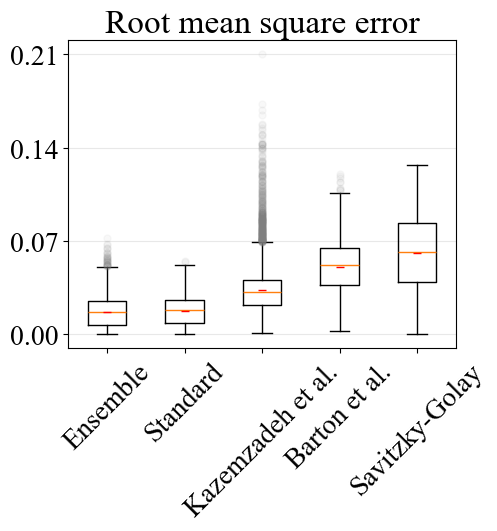

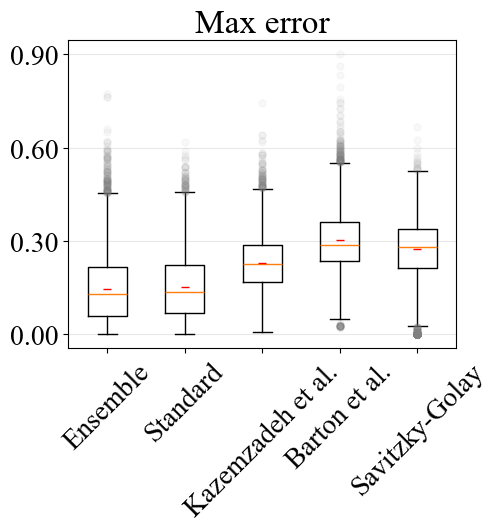

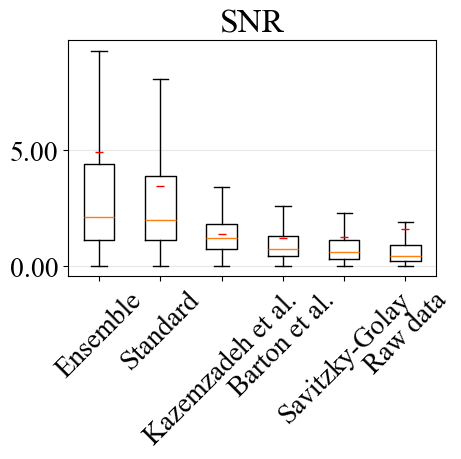

In [8]:
plt.rcParams.update({'font.size': 20})
plt.rcParams["font.family"] = "Times New Roman"
dimension = (5, 4)
for key in full_metrics_dict.keys():
    print(key)
    
    key2 = list(full_metrics_dict[key].keys())[:-1] # Remove the Raw statistics (they are zero)
    print(key2)

    # RMSE metrics
    flier_props = dict(marker='o', markerfacecolor='gray', alpha = 0.05, markersize=5,
                  linestyle='none', markeredgecolor="gray")
    mean_props = {"marker": "_", 'markerfacecolor': "Red", 'markeredgecolor': "Red"}
    num_ticks = 4
    
    model_metrics = [full_metrics_dict[key][k][0] for k in key2]
    fig, ax = plt.subplots(figsize = dimension)
    ax.boxplot(model_metrics,
                  labels = key2,
                  showmeans=True, 
                  flierprops = flier_props,
                  meanprops= mean_props,
                 )

    
    ax.set_title("Root mean square error")
    max_ = np.max([full_metrics_dict[key][k][0] for k in key2])
    ticks = np.linspace(0, max_, num_ticks)
    ax.set_yticks(ticks)
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
    ax.set_xticklabels(key2, rotation = 45)
    plt.savefig("Figures/Metrics/N_RMSE.png", format="png",
                bbox_inches='tight',
                dpi = 1000,
                transparent = True,
                pad_inches=0.5)
    plt.show()
    
    
    # Max error metrics
    model_metrics = [full_metrics_dict[key][k][1] for k in key2]
    fig, ax = plt.subplots(figsize = dimension)
    ax.boxplot(model_metrics,
                  labels = key2,
                 showmeans=True,
                  flierprops = flier_props,
                  meanprops= mean_props,
                 #showfliers=False,
                 )
    ax.set_title("Max error")
    max_ = np.max([full_metrics_dict[key][k][1] for k in key2])
    ticks = np.linspace(0, max_, num_ticks)
    ax.set_yticks(ticks)
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
    ax.set_xticklabels(key2, rotation = 45)
    plt.savefig("Figures/Metrics/N_MaxError.png", format="png",
                bbox_inches='tight',
                dpi = 1000,
                transparent = True,
                pad_inches=0.5)
    plt.show()
    
    # SNR metrics
    key2 = list(full_metrics_dict[key].keys())
    model_metrics = [full_metrics_dict[key][k][2] for k in key2]
    fig, ax = plt.subplots(figsize = (5, 5))
    ax.boxplot(model_metrics,
                  labels = key2,
                 showmeans=True,
                  flierprops = flier_props,
                  meanprops= mean_props,
                  showfliers=False,
                 )
    
    ax.set_title("SNR")
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
    ax.set_xticklabels(key2, rotation = 45)
    fig.tight_layout() # Improves spacing between plots to prevent overlap
    
    plt.savefig("Figures/Metrics/N_SNR.png", format="png",
                bbox_inches='tight',
                dpi = 1000,
                transparent = True,
                pad_inches=0.5)
    plt.show()

In [13]:
model_metrics = [full_metrics_dict[key][k][2] for k in key2]

for i in model_metrics:
    print(np.percentile(i, [75, 25]))

[4.4 1.1]
[3.9 1.1]
[1.8 0.7]
[1.3 0.4]
[1.1 0.3]
[0.9 0.2]
